# 🔩 Classical Image Processing for Object Analysis
## Building AI-Powered Defect Detection Systems for Industrial Quality Control — Pre-Deep Learning Techniques

**Objective:** Given an image of assorted hardware (screws, nuts, washers, bolts), use *only* classical image processing techniques to:

1. **Count** the number of screws, nuts, and washers present in the image
2. **Measure** the length of all screws and identify the shortest and longest (with oriented bounding boxes)
3. **Measure** the diameter of all nuts and identify the smallest and largest (with oriented bounding boxes)

**Why this matters for defect detection:** Every technique you learn here — filtering, thresholding, morphology, contour analysis, feature extraction — forms the foundation of preprocessing pipelines used in modern deep learning systems. Understanding *what* these operations do to pixel data gives you intuition that no amount of `model.fit()` calls can provide.

**Prerequisites:** Python, basic NumPy/array operations  
**Libraries:** OpenCV, NumPy, Matplotlib  
**Time:** ~90 minutes


## 0. Environment Setup

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import warnings
warnings.filterwarnings('ignore')

# Consistent plot styling
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 11

# Helper: show one or more images side by side
def show_images(images, titles=None, cmap=None, figsize=(16, 5)):
    """Display a list of images side by side."""
    n = len(images)
    fig, axes = plt.subplots(1, n, figsize=figsize)
    if n == 1:
        axes = [axes]
    for i, (img, ax) in enumerate(zip(images, axes)):
        if len(img.shape) == 2:
            ax.imshow(img, cmap=cmap or 'gray')
        else:
            ax.imshow(img)
        if titles:
            ax.set_title(titles[i], fontsize=12)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

print("✅ Setup complete")
print(f"OpenCV version: {cv2.__version__}")
print(f"NumPy version: {np.__version__}")


✅ Setup complete
OpenCV version: 4.13.0
NumPy version: 1.19.2


---
## Part 1: Image Loading & Fundamentals

Before we can analyze anything, we need to understand what an image *is* to a computer: a multi-dimensional array of numbers.

### Key Concepts
- Images are NumPy arrays with shape `(Height, Width, Channels)`
- Pixel values range from 0 (black) to 255 (white) for 8-bit images
- OpenCV loads images in **BGR** order (not RGB!) — a common gotcha
- Color spaces (RGB, HSV, Grayscale, LAB) reveal different information about the scene


### 1.1 Load and Inspect the Image

In [2]:
# Load the image
img_bgr = cv2.imread('screws_017.png')  # OpenCV loads as BGR

# CRITICAL: Always check if the image loaded successfully
if img_bgr is None:
    raise FileNotFoundError("Could not load image. Check the file path!")

# Basic properties
print(f"Shape:    {img_bgr.shape}")          # (Height, Width, Channels)
print(f"Dtype:    {img_bgr.dtype}")           # uint8 = unsigned 8-bit integer
print(f"Size:     {img_bgr.shape[1]} x {img_bgr.shape[0]} pixels")
print(f"Channels: {img_bgr.shape[2]}")
print(f"Total pixels: {img_bgr.shape[0] * img_bgr.shape[1]:,}")
print(f"Memory:   {img_bgr.nbytes / 1024 / 1024:.1f} MB")
print(f"Value range: [{img_bgr.min()}, {img_bgr.max()}]")


Shape:    (1440, 1920, 3)
Dtype:    uint8
Size:     1920 x 1440 pixels
Channels: 3
Total pixels: 2,764,800
Memory:   7.9 MB
Value range: [0, 255]


### 1.2 Color Space Conversions

**Why do color spaces matter?**

Different color spaces separate information differently. For metallic objects on a wood background:
- **Grayscale**: simplest, but loses color info that distinguishes brass from wood
- **HSV (Hue, Saturation, Value)**: separates color (H) from intensity (V) — chrome has low saturation
- **LAB**: perceptually uniform — the B channel separates warm (wood) from cool (chrome) tones

Choosing the right color space is often the single most impactful decision in classical image processing.


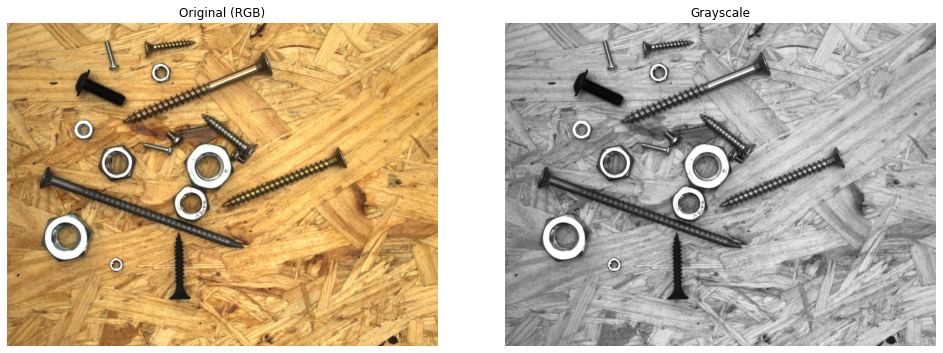

In [4]:
# Convert between color spaces
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)    # For matplotlib display
gray    = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)   # Single channel
hsv     = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)    # Hue, Saturation, Value
lab     = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2LAB)    # Lightness, A, B

# Display the original and grayscale
show_images(
    [img_rgb, gray],
    titles=['Original (RGB)', 'Grayscale'],
    figsize=(14, 5)
)


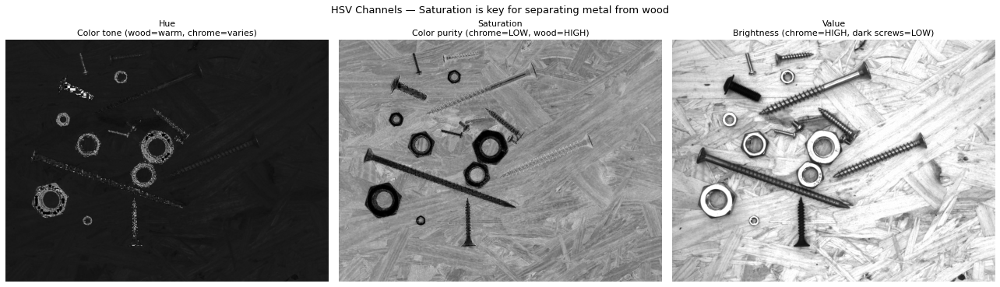

Hue         : min=  0, max=179, mean=19.4, std=12.9
Saturation  : min=  0, max=255, mean=137.8, std=31.0
Value       : min=  5, max=255, mean=201.6, std=48.1


In [5]:
# Explore HSV channels — each reveals different information
h, s, v = hsv[:,:,0], hsv[:,:,1], hsv[:,:,2]

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
for ax, channel, name, info in zip(axes, [h, s, v],
    ['Hue', 'Saturation', 'Value'],
    ['Color tone (wood=warm, chrome=varies)',
     'Color purity (chrome=LOW, wood=HIGH)',
     'Brightness (chrome=HIGH, dark screws=LOW)']):
    ax.imshow(channel, cmap='gray')
    ax.set_title(f'{name}\n{info}', fontsize=11)
    ax.axis('off')
plt.suptitle('HSV Channels — Saturation is key for separating metal from wood', fontsize=13, y=1.02)
plt.tight_layout()
plt.show()

# Print statistics
for name, ch in [('Hue', h), ('Saturation', s), ('Value', v)]:
    print(f"{name:12s}: min={ch.min():3d}, max={ch.max():3d}, mean={ch.mean():.1f}, std={ch.std():.1f}")


### 1.3 Basic Image Operations

These are the building blocks you'll use constantly — in preprocessing pipelines, data augmentation, and visualization.


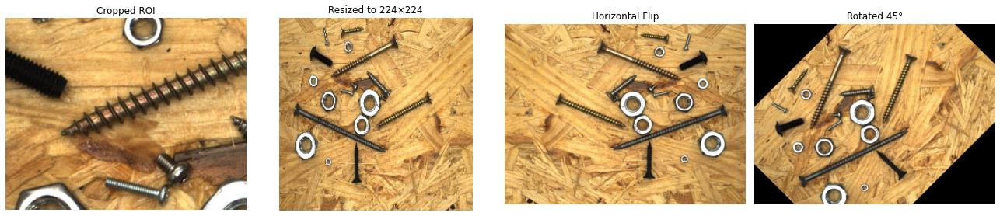

In [6]:
# Cropping — extract a region of interest (ROI)
# NumPy slicing: img[y_start:y_end, x_start:x_end]
roi = img_rgb[200:600, 400:900]

# Resizing — models need consistent input dimensions
resized_half = cv2.resize(img_bgr, None, fx=0.5, fy=0.5, interpolation=cv2.INTER_AREA)
resized_224  = cv2.resize(img_bgr, (224, 224), interpolation=cv2.INTER_LINEAR)

# Flipping — common data augmentation
flipped_h = cv2.flip(img_rgb, 1)  # horizontal
flipped_v = cv2.flip(img_rgb, 0)  # vertical

# Rotation — another common augmentation
center = (img_bgr.shape[1]//2, img_bgr.shape[0]//2)
M = cv2.getRotationMatrix2D(center, 45, 1.0)  # 45 degrees, scale=1
rotated = cv2.warpAffine(img_rgb, M, (img_bgr.shape[1], img_bgr.shape[0]))

show_images(
    [roi, cv2.cvtColor(resized_224, cv2.COLOR_BGR2RGB), flipped_h, rotated],
    titles=['Cropped ROI', 'Resized to 224×224', 'Horizontal Flip', 'Rotated 45°'],
    figsize=(18, 4)
)


#### 💡 Connection to Deep Learning Pipelines

Every operation above appears in training pipelines:
- **Resize**: Models require fixed input dimensions (224×224, 256×256)
- **Crop**: Random crops are a standard augmentation technique
- **Flip/Rotate**: Geometric augmentations that increase training data variety
- **Color space conversion**: Input normalization (e.g., subtract ImageNet mean from each RGB channel)

The difference? In DL pipelines these are automated via `torchvision.transforms`. Here, we do them manually to understand what each transform actually does to the pixel data.


---
## Part 2: Image Filtering & Noise Reduction

**The problem:** Our wood background has intense texture (grain, chips, shadows) that will create noise in any segmentation attempt. Filtering reduces this texture while preserving the object edges we care about.

### Key Concepts
- Filters operate by sliding a **kernel** (small matrix) across the image
- **Gaussian blur**: weighted average, good general-purpose smoothing
- **Median filter**: replaces with median value, excellent for salt-and-pepper noise
- **Bilateral filter**: smooths texture but PRESERVES edges — best of both worlds


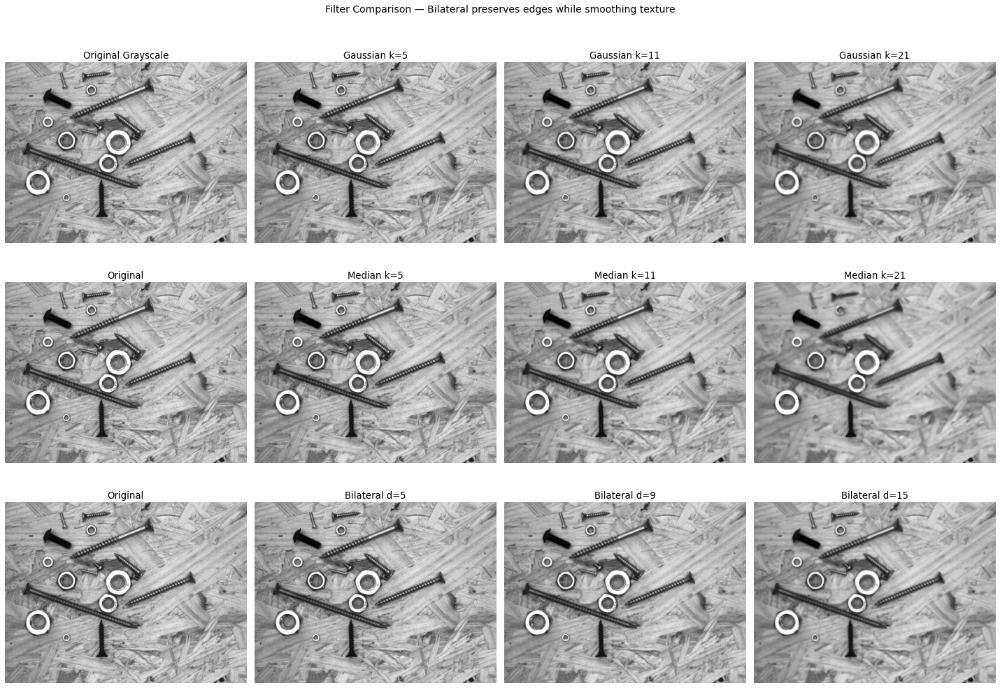

In [7]:
# Apply different filters and compare
blur_sizes = [5, 11, 21]

fig, axes = plt.subplots(3, 4, figsize=(20, 14))

# Row 0: Gaussian blur
axes[0, 0].imshow(gray, cmap='gray')
axes[0, 0].set_title('Original Grayscale')
for i, k in enumerate(blur_sizes):
    blurred = cv2.GaussianBlur(gray, (k, k), 0)
    axes[0, i+1].imshow(blurred, cmap='gray')
    axes[0, i+1].set_title(f'Gaussian k={k}')
axes[0, 0].set_ylabel('Gaussian Blur', fontsize=12, rotation=90, labelpad=40)

# Row 1: Median filter
axes[1, 0].imshow(gray, cmap='gray')
axes[1, 0].set_title('Original')
for i, k in enumerate(blur_sizes):
    median = cv2.medianBlur(gray, k)
    axes[1, i+1].imshow(median, cmap='gray')
    axes[1, i+1].set_title(f'Median k={k}')
axes[1, 0].set_ylabel('Median Filter', fontsize=12, rotation=90, labelpad=40)

# Row 2: Bilateral filter
axes[2, 0].imshow(gray, cmap='gray')
axes[2, 0].set_title('Original')
for i, (d, sc, ss) in enumerate([(5, 50, 50), (9, 75, 75), (15, 100, 100)]):
    bilateral = cv2.bilateralFilter(gray, d, sc, ss)
    axes[2, i+1].imshow(bilateral, cmap='gray')
    axes[2, i+1].set_title(f'Bilateral d={d}')
axes[2, 0].set_ylabel('Bilateral Filter', fontsize=12, rotation=90, labelpad=40)

for ax in axes.flat:
    ax.axis('off')
plt.suptitle('Filter Comparison — Bilateral preserves edges while smoothing texture', fontsize=14, y=1.01)
plt.tight_layout()
plt.show()


#### 🔍 Observe:
- **Gaussian** blurs everything uniformly — edges and texture alike
- **Median** is excellent at removing isolated noisy pixels while keeping edges sharp
- **Bilateral** is the clear winner here: it smooths the wood grain while keeping screw/nut edges crisp

**For our pipeline**, we'll use bilateral filtering as the primary preprocessing step.


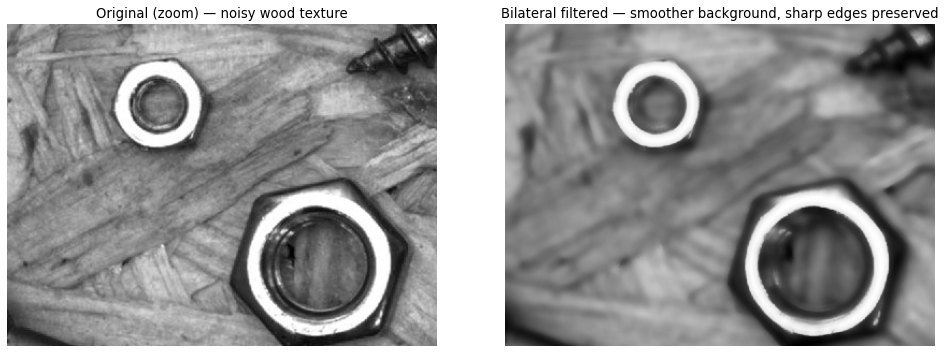

In [8]:
# Our chosen filter for this pipeline
filtered = cv2.bilateralFilter(gray, 11, 75, 75)

# Zoom into a region to see the difference clearly
y1, y2, x1, x2 = 400, 700, 200, 600
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].imshow(gray[y1:y2, x1:x2], cmap='gray')
axes[0].set_title('Original (zoom) — noisy wood texture')
axes[1].imshow(filtered[y1:y2, x1:x2], cmap='gray')
axes[1].set_title('Bilateral filtered — smoother background, sharp edges preserved')
for ax in axes: ax.axis('off')
plt.tight_layout()
plt.show()


---
## Part 3: Thresholding & Segmentation

**Goal:** Convert our grayscale image into a binary mask where foreground (objects) = white and background (wood) = black.

### The Challenge
This image is deceptively hard to segment because:
1. **Brass screws** have similar intensity to the wood background
2. **Chrome nuts** are very bright (easy) but **black screws** are very dark (also easy individually, but very different from chrome)
3. Objects are close together in the center — risk of merging

We'll explore multiple approaches and combine the best of each.


### 3.1 Global Thresholding (Simple but Limited)

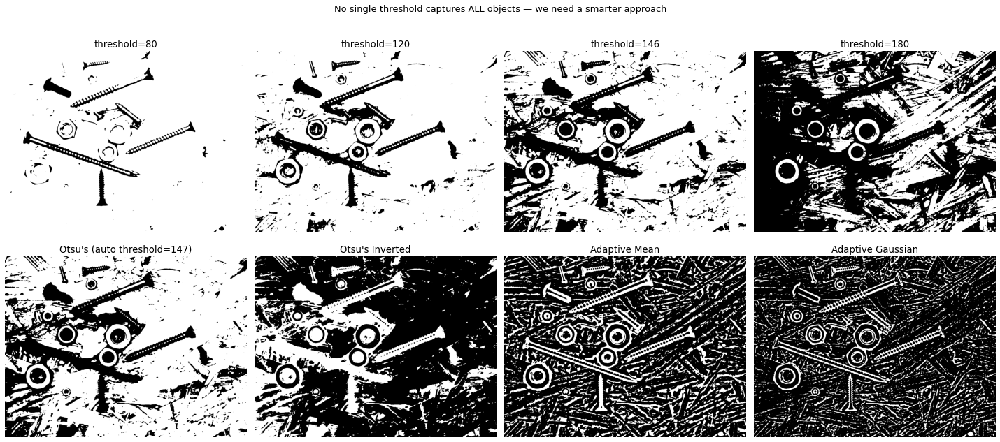

In [9]:
# Global threshold — one threshold value for the entire image
blur = cv2.GaussianBlur(gray, (11, 11), 0)

# Try different threshold values
fig, axes = plt.subplots(2, 4, figsize=(20, 9))

thresholds = [80, 120, 146, 180]
for i, t in enumerate(thresholds):
    _, binary = cv2.threshold(blur, t, 255, cv2.THRESH_BINARY)
    axes[0, i].imshow(binary, cmap='gray')
    axes[0, i].set_title(f'threshold={t}')

# Otsu's method — automatically finds optimal threshold
otsu_val, otsu_mask = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
axes[1, 0].imshow(otsu_mask, cmap='gray')
axes[1, 0].set_title(f"Otsu's (auto threshold={otsu_val:.0f})")

# Inverted Otsu
_, otsu_inv = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
axes[1, 1].imshow(otsu_inv, cmap='gray')
axes[1, 1].set_title("Otsu's Inverted")

# Adaptive threshold — local threshold varies across image
adapt_mean = cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_MEAN_C,
                                    cv2.THRESH_BINARY_INV, 51, 10)
axes[1, 2].imshow(adapt_mean, cmap='gray')
axes[1, 2].set_title('Adaptive Mean')

adapt_gauss = cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                     cv2.THRESH_BINARY_INV, 51, 10)
axes[1, 3].imshow(adapt_gauss, cmap='gray')
axes[1, 3].set_title('Adaptive Gaussian')

for ax in axes.flat: ax.axis('off')
plt.suptitle('No single threshold captures ALL objects — we need a smarter approach', fontsize=13, y=1.01)
plt.tight_layout()
plt.show()


#### 🔑 Key Insight

Notice the fundamental problem:
- **Low threshold (80)**: captures dark screws but also captures wood shadows
- **High threshold (180)**: clean background but misses everything except chrome nuts
- **Otsu's**: finds a compromise but still can't handle objects at both intensity extremes

**Solution**: Multi-threshold segmentation — detect bright AND dark objects separately, then combine.


### 3.2 Background Subtraction & Multi-Threshold Approach

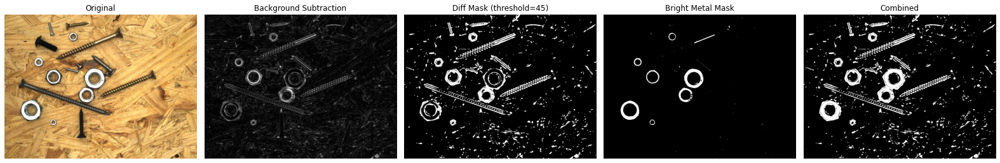

In [10]:
# STRATEGY: Objects differ from their LOCAL background
# Step 1: Estimate the background using a large median filter
background = cv2.medianBlur(gray, 51)

# Step 2: Foreground = how much each pixel differs from local background
foreground_diff = cv2.absdiff(
    filtered.astype(np.int16),
    background.astype(np.int16)
).astype(np.uint8)

# Step 3: Enhance contrast of the difference image
fg_enhanced = cv2.normalize(foreground_diff, None, 0, 255, cv2.NORM_MINMAX)

# Step 4: Threshold the difference — pixels that differ significantly from background
_, diff_mask = cv2.threshold(fg_enhanced, 45, 255, cv2.THRESH_BINARY)

# Step 5: Also catch very bright chrome objects using saturation
s_blur = cv2.GaussianBlur(hsv[:,:,1], (11, 11), 0)
v_blur = cv2.GaussianBlur(hsv[:,:,2], (11, 11), 0)

# Chrome = high brightness + low saturation (colorless metal)
bright_metal = cv2.bitwise_and(
    cv2.threshold(v_blur, 210, 255, cv2.THRESH_BINARY)[1],
    cv2.threshold(s_blur, 100, 255, cv2.THRESH_BINARY_INV)[1]
)

# Step 6: Combine both masks
combined_mask = cv2.bitwise_or(diff_mask, bright_metal)

show_images(
    [img_rgb, fg_enhanced, diff_mask, bright_metal, combined_mask],
    titles=['Original', 'Background Subtraction', 'Diff Mask (threshold=45)',
            'Bright Metal Mask', 'Combined'],
    figsize=(22, 4)
)


#### Why Background Subtraction Works

Instead of asking *"is this pixel bright or dark?"* (global threshold), we ask *"does this pixel differ from its neighborhood?"*

- A brass screw on wood: both have similar absolute brightness (~140), but the screw has **different texture** → produces a difference signal
- Chrome nut: extremely bright (250) vs. wood (170) → massive difference signal
- Black screw: very dark (50) vs. wood (170) → massive difference signal

This is analogous to how your eye works — you detect objects by **contrast**, not absolute brightness.


---
## Part 4: Morphological Operations

Our binary mask has noise (small white specks from wood texture) and gaps (holes inside objects). Morphological operations clean this up using structured shape elements.

### Key Operations
| Operation | Effect | When to Use |
|-----------|--------|-------------|
| **Erosion** | Shrinks white regions | Remove small noise |
| **Dilation** | Grows white regions | Fill small gaps |
| **Opening** | Erosion → Dilation | Remove noise, preserve object size |
| **Closing** | Dilation → Erosion | Fill gaps, preserve object size |


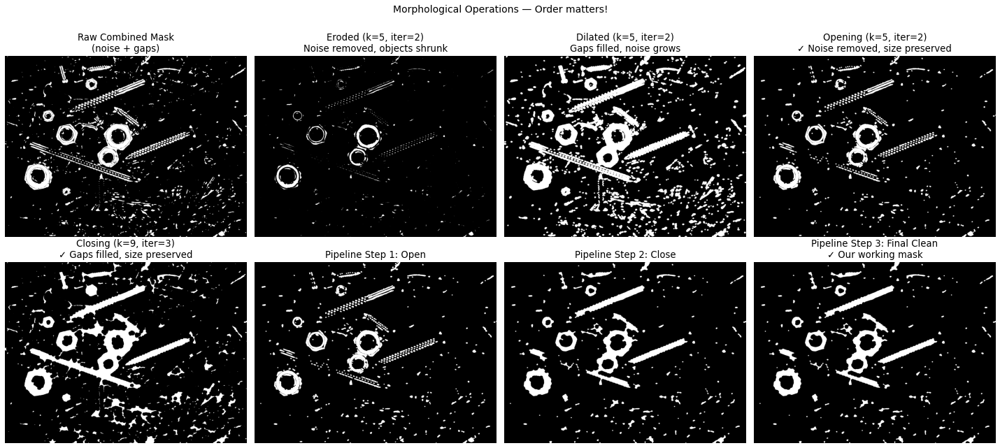

Connected components in clean mask: 190


In [11]:
# Structuring elements (kernels) of different sizes
k3 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
k5 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
k7 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
k9 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (9, 9))

# Demonstrate each operation
fig, axes = plt.subplots(2, 4, figsize=(20, 9))

# Show the raw mask and its problems
axes[0, 0].imshow(combined_mask, cmap='gray')
axes[0, 0].set_title('Raw Combined Mask\n(noise + gaps)')

# Erosion removes noise but shrinks objects
eroded = cv2.erode(combined_mask, k5, iterations=2)
axes[0, 1].imshow(eroded, cmap='gray')
axes[0, 1].set_title('Eroded (k=5, iter=2)\nNoise removed, objects shrunk')

# Dilation fills gaps but grows noise too
dilated = cv2.dilate(combined_mask, k5, iterations=2)
axes[0, 2].imshow(dilated, cmap='gray')
axes[0, 2].set_title('Dilated (k=5, iter=2)\nGaps filled, noise grows')

# Opening: best for noise removal
opened = cv2.morphologyEx(combined_mask, cv2.MORPH_OPEN, k5, iterations=2)
axes[0, 3].imshow(opened, cmap='gray')
axes[0, 3].set_title('Opening (k=5, iter=2)\n✓ Noise removed, size preserved')

# Closing: best for gap filling
closed = cv2.morphologyEx(combined_mask, cv2.MORPH_CLOSE, k9, iterations=3)
axes[1, 0].imshow(closed, cmap='gray')
axes[1, 0].set_title('Closing (k=9, iter=3)\n✓ Gaps filled, size preserved')

# Our pipeline: Open (remove noise) → Close (fill gaps) → Open (clean edges)
step1 = cv2.morphologyEx(combined_mask, cv2.MORPH_OPEN, k5, iterations=2)
step2 = cv2.morphologyEx(step1, cv2.MORPH_CLOSE, k9, iterations=3)
step3 = cv2.morphologyEx(step2, cv2.MORPH_OPEN, k3, iterations=1)
clean_mask = step3

axes[1, 1].imshow(step1, cmap='gray')
axes[1, 1].set_title('Pipeline Step 1: Open')
axes[1, 2].imshow(step2, cmap='gray')
axes[1, 2].set_title('Pipeline Step 2: Close')
axes[1, 3].imshow(step3, cmap='gray')
axes[1, 3].set_title('Pipeline Step 3: Final Clean\n✓ Our working mask')

for ax in axes.flat: ax.axis('off')
plt.suptitle('Morphological Operations — Order matters!', fontsize=14, y=1.01)
plt.tight_layout()
plt.show()

# Count connected components as quick check
n_labels, labels = cv2.connectedComponents(clean_mask)
print(f"Connected components in clean mask: {n_labels - 1}")  # subtract 1 for background


#### ⚠️ Morphological Pitfalls

The order and magnitude of operations matter enormously:
- **Too much opening** → deletes thin objects (screws disappear!)
- **Too much closing** → merges nearby objects (nuts fuse with adjacent screws)
- **Wrong kernel shape** → rectangular kernel on round objects creates artifacts

**Rule of thumb**: Start small, increase gradually, and ALWAYS visualize intermediate results.


---
## Part 5: Separating Touching Objects & Contour Detection

### The Problem
Some objects in our mask are touching or very close together. Simple contour detection would treat them as one giant blob. We need to separate them first.

### Solution: Watershed Algorithm
The watershed treats the image like a topographic map:
1. Compute **distance transform** — how far each white pixel is from the nearest edge
2. Find **peaks** in the distance map — these are object centers  
3. **Grow regions** from peaks until they meet — the meeting lines become boundaries


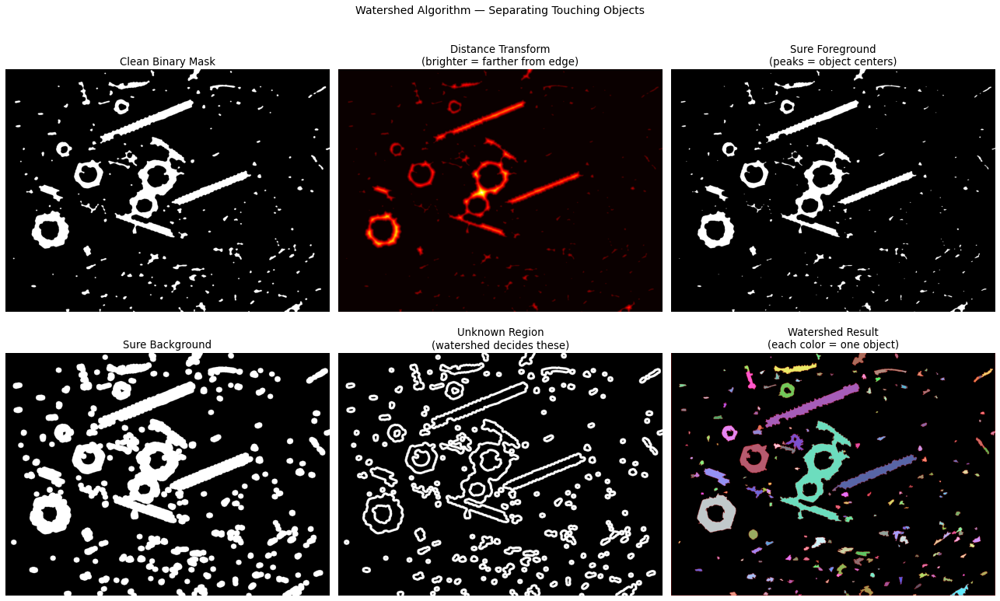

In [12]:
# Step 1: Distance transform
dist_transform = cv2.distanceTransform(clean_mask, cv2.DIST_L2, 5)
dist_normalized = cv2.normalize(dist_transform, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

# Step 2: Find sure foreground (peaks of distance transform)
# These are pixels definitely inside an object
_, sure_fg = cv2.threshold(dist_normalized, 0.35 * dist_transform.max(), 255, cv2.THRESH_BINARY)
sure_fg = sure_fg.astype(np.uint8)

# Step 3: Find sure background (dilated mask)
sure_bg = cv2.dilate(clean_mask, k9, iterations=3)

# Step 4: Unknown region (between sure foreground and sure background)
unknown = cv2.subtract(sure_bg, sure_fg)

# Step 5: Label connected components of sure foreground
_, markers = cv2.connectedComponents(sure_fg)
markers = markers + 1          # Background becomes 1 (not 0)
markers[unknown == 255] = 0    # Unknown region becomes 0

# Step 6: Apply watershed
img_watershed = img_bgr.copy()
markers_ws = cv2.watershed(img_watershed, markers)

# Visualize the process
fig, axes = plt.subplots(2, 3, figsize=(18, 11))
axes[0,0].imshow(clean_mask, cmap='gray')
axes[0,0].set_title('Clean Binary Mask')

axes[0,1].imshow(dist_normalized, cmap='hot')
axes[0,1].set_title('Distance Transform\n(brighter = farther from edge)')

axes[0,2].imshow(sure_fg, cmap='gray')
axes[0,2].set_title('Sure Foreground\n(peaks = object centers)')

axes[1,0].imshow(sure_bg, cmap='gray')
axes[1,0].set_title('Sure Background')

axes[1,1].imshow(unknown, cmap='gray')
axes[1,1].set_title('Unknown Region\n(watershed decides these)')

# Colorize watershed result
ws_vis = np.zeros_like(img_rgb)
for label in range(2, markers_ws.max() + 1):
    # Random color per object
    color = np.random.randint(80, 255, 3).tolist()
    ws_vis[markers_ws == label] = color
ws_vis[markers_ws == -1] = [255, 0, 0]  # Boundaries in red
axes[1,2].imshow(ws_vis)
axes[1,2].set_title('Watershed Result\n(each color = one object)')

for ax in axes.flat: ax.axis('off')
plt.suptitle('Watershed Algorithm — Separating Touching Objects', fontsize=14, y=1.01)
plt.tight_layout()
plt.show()


### 5.1 Extract Individual Object Contours

Total contours found: 172
Valid contours (area 1500–150000): 21


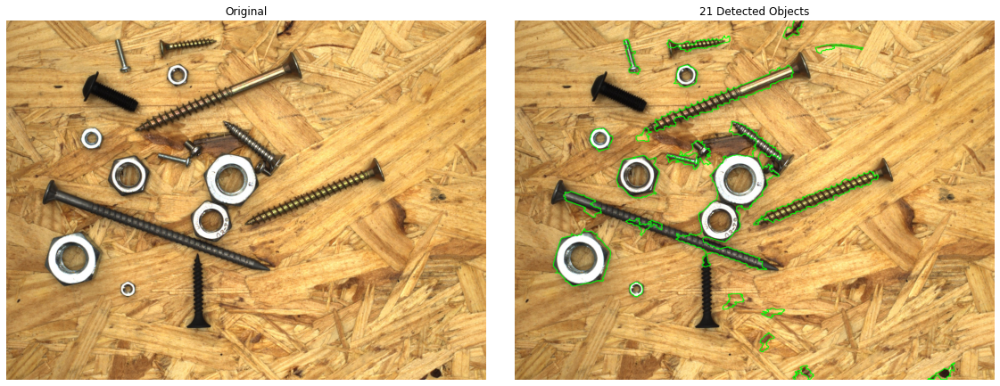

In [13]:
# Create final mask from watershed labels
final_mask = np.zeros_like(gray)
for label in range(2, markers_ws.max() + 1):
    final_mask[markers_ws == label] = 255

# Find contours
contours, hierarchy = cv2.findContours(final_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

print(f"Total contours found: {len(contours)}")

# Filter by area to remove tiny noise contours
MIN_AREA = 1500    # Minimum object area in pixels
MAX_AREA = 150000  # Maximum (to filter out merged background blobs)

valid_contours = []
for c in contours:
    area = cv2.contourArea(c)
    if MIN_AREA < area < MAX_AREA:
        valid_contours.append(c)

print(f"Valid contours (area {MIN_AREA}–{MAX_AREA}): {len(valid_contours)}")

# Visualize all valid contours
vis = img_rgb.copy()
cv2.drawContours(vis, valid_contours, -1, (0, 255, 0), 2)
show_images([img_rgb, vis], titles=['Original', f'{len(valid_contours)} Detected Objects'], figsize=(16, 6))


---
## Part 6: Feature Extraction & Object Classification

Now we extract **shape features** from each contour to classify objects as screws, nuts, or washers. This is the pre-deep-learning version of what CNNs learn automatically.

### Shape Features We'll Use

| Feature | Formula | Screws | Nuts | Washers |
|---------|---------|--------|------|---------|
| **Aspect Ratio** | max_dim / min_dim | HIGH (>2.5) | LOW (~1.0) | LOW (~1.0) |
| **Circularity** | 4π × Area / Perimeter² | LOW | HIGH (>0.5) | HIGH |
| **Solidity** | Area / ConvexHull Area | Varies | HIGH (>0.85) | HIGH |
| **Area** | Total pixels | Varies | LARGE | SMALL |


In [22]:
def extract_features(contour, gray_img, hsv_img):
    """Extract comprehensive shape and appearance features from a contour."""
    area = cv2.contourArea(contour)
    perimeter = cv2.arcLength(contour, True)
    
    # Oriented bounding box (minimum area rectangle)
    rect = cv2.minAreaRect(contour)
    (cx, cy), (w, h), angle = rect
    if w < h:
        w, h = h, w
        angle = angle + 90 if angle < 0 else angle - 90
    
    # Shape metrics
    aspect_ratio = w / max(h, 1)
    circularity = 4 * np.pi * area / max(perimeter ** 2, 1)
    
    # Solidity = how much of the convex hull is filled
    hull = cv2.convexHull(contour)
    hull_area = cv2.contourArea(hull)
    solidity = area / max(hull_area, 1)
    
    # Centroid
    moments = cv2.moments(contour)
    if moments['m00'] > 0:
        cx_m = int(moments['m10'] / moments['m00'])
        cy_m = int(moments['m01'] / moments['m00'])
    else:
        cx_m, cy_m = int(cx), int(cy)
    
    # Mean intensity and saturation inside the contour
    obj_mask = np.zeros_like(gray_img)
    cv2.drawContours(obj_mask, [contour], 0, 255, -1)
    mean_intensity = cv2.mean(gray_img, mask=obj_mask)[0]
    mean_saturation = cv2.mean(hsv_img[:,:,1], mask=obj_mask)[0]
    
    return {
        'contour': contour,
        'area': area,
        'perimeter': perimeter,
        'rect': rect,
        'width': w,
        'height': h,
        'angle': angle,
        'aspect_ratio': aspect_ratio,
        'circularity': circularity,
        'solidity': solidity,
        'centroid': (cx_m, cy_m),
        'mean_intensity': mean_intensity,
        'mean_saturation': mean_saturation,
    }

# Extract features for all valid contours
objects = [extract_features(c, gray, hsv) for c in valid_contours]

# Print feature table
print(f"{'#':>3} {'Area':>7} {'W×H':>12} {'AR':>5} {'Circ':>5} {'Sol':>5} {'Intens':>6} {'Sat':>5}")
print("-" * 60)
for i, obj in enumerate(sorted(objects, key=lambda x: x['area'], reverse=True)):
    print(f"{i:3d} {obj['area']:7.0f} {obj['width']:5.0f}×{obj['height']:<5.0f} "
          f"{obj['aspect_ratio']:5.2f} {obj['circularity']:5.3f} {obj['solidity']:5.3f} "
          f"{obj['mean_intensity']:6.1f} {obj['mean_saturation']:5.1f}")


  #    Area          W×H    AR  Circ   Sol Intens   Sat
------------------------------------------------------------
  0   80143   592×379    1.56 0.085 0.477  138.3  63.7
  1   36823   233×213    1.09 0.631 0.938  160.6  50.5
  2   25858   600×65     9.30 0.098 0.709  101.0 125.9
  3   21628   173×165    1.05 0.588 0.920  124.8  75.0
  4   20358   535×60     8.87 0.113 0.736   88.7 146.7
  5    6650   171×109    1.57 0.072 0.483  102.9 109.7
  6    6312   168×63     2.69 0.268 0.765   77.3  62.0
  7    6006   253×52     4.83 0.127 0.573   96.1 140.6
  8    5858    90×85     1.06 0.652 0.930  146.9  71.1
  9    5735    94×82     1.15 0.684 0.937  168.9  54.2
 10    3106   147×47     3.14 0.188 0.584  113.5  82.2
 11    2872    96×58     1.67 0.314 0.732   96.2 151.3
 12    2796   149×67     2.22 0.110 0.433   70.5  63.6
 13    2632    94×54     1.74 0.248 0.730  151.6 152.7
 14    2338   126×45     2.83 0.199 0.679   83.4 147.3
 15    2272    54×54     1.01 0.815 0.972  169.5  56.3
 16

### 6.1 Classify Objects Using Feature Rules

In [23]:
def classify_object(features):
    """Classify an object based on its shape and appearance features.
    
    Classification rules (empirically determined by analyzing feature distributions):
    - NUT: circular, high solidity (includes hex nuts and smaller lock nuts)
    - SCREW: elongated (high aspect ratio)
    - OTHER: partial detections, ambiguous shapes
    """
    ar = features['aspect_ratio']
    circ = features['circularity']
    sol = features['solidity']
    area = features['area']
    
    # Rule 1: Elongated objects are screws
    if ar > 2.5:
        return 'SCREW'
    
    # Rule 2: Circular + compact objects are nuts (all sizes)
    if circ > 0.5 and ar < 1.6 and sol > 0.8:
        return 'NUT'
    
    # Rule 3: Moderately elongated with decent solidity → likely a screw
    if ar > 2.0 and sol > 0.6:
        return 'SCREW'
    
    # Rule 4: Large circular-ish → probably a nut seen at angle
    if circ > 0.4 and ar < 1.5 and area > 10000:
        return 'NUT'
    
    return 'OTHER'

# Classify all objects
screws, nuts, other = [], [], []
for obj in objects:
    label = classify_object(obj)
    obj['label'] = label
    if label == 'SCREW':
        screws.append(obj)
    elif label == 'NUT':
        nuts.append(obj)
    else:
        other.append(obj)

print("=" * 50)
print(f"  CLASSIFICATION RESULTS")
print("=" * 50)
print(f"  Screws:  {len(screws)}")
print(f"  Nuts:    {len(nuts)}")
print(f"  Other:   {len(other)}")
print("=" * 50)


  CLASSIFICATION RESULTS
  Screws:  8
  Nuts:    5
  Other:   8


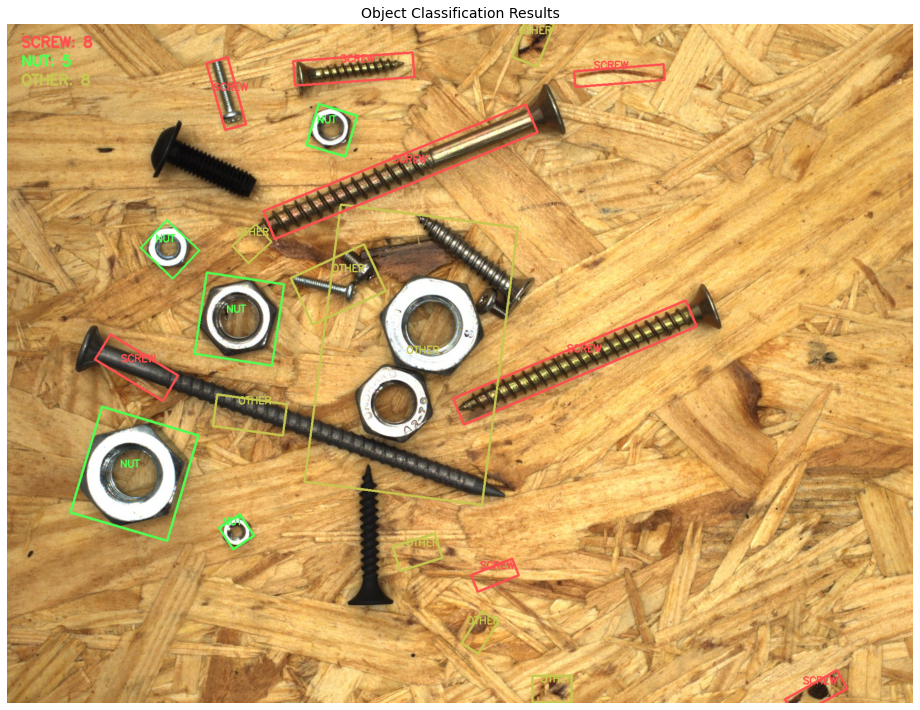

In [24]:
# Visualize classified objects with color-coded bounding boxes
COLORS = {
    'SCREW':  (255, 80, 80),    # Red
    'NUT':    (80, 255, 80),    # Green
    'OTHER':  (200, 200, 80),   # Yellow
}

vis = img_rgb.copy()
for obj in objects:
    color = COLORS[obj['label']]
    
    # Draw oriented bounding box
    box = cv2.boxPoints(obj['rect']).astype(np.int32)
    cv2.drawContours(vis, [box], 0, color, 3)
    
    # Draw label
    cx, cy = obj['centroid']
    cv2.putText(vis, obj['label'], (cx - 30, cy - 15),
                cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)

# Add legend
legend_y = 50
for label, color in COLORS.items():
    count = sum(1 for o in objects if o['label'] == label)
    cv2.putText(vis, f"{label}: {count}", (30, legend_y),
                cv2.FONT_HERSHEY_SIMPLEX, 1.0, color, 3)
    legend_y += 40

plt.figure(figsize=(14, 10))
plt.imshow(vis)
plt.title('Object Classification Results', fontsize=14)
plt.axis('off')
plt.tight_layout()
plt.show()


#### 🤔 Reflection: Why isn't this perfect?

You'll notice some objects may be misclassified or missed entirely. This is expected! Classical CV struggles with:
1. **Brass screws on wood** — similar intensity, color, and texture to background
2. **Overlapping objects** — even watershed can't always separate them
3. **Hand-tuned thresholds** — change the lighting or camera, and everything breaks

This is precisely why deep learning revolutionized computer vision — CNNs learn features that generalize, rather than relying on brittle, hand-crafted rules. But you need to understand *what* those rules are to understand *what* the CNN is learning.


---
## Part 7: Measurements & Final Analysis

### 7.1 Measuring Screw Lengths
We use the **oriented bounding box** (minimum area rectangle) to measure the length of each screw. The longer dimension of this rectangle approximates the screw length.

> **Note:** Without a known reference object for calibration, all measurements are in **pixels**. In a production system, you'd place a calibration target (e.g., a ruler or circle of known diameter) in the field of view.


In [25]:
# Analyze screws
if screws:
    print("SCREW MEASUREMENTS (pixels)")
    print("-" * 55)
    print(f"{'#':>3} {'Length (px)':>11} {'Width (px)':>11} {'Aspect Ratio':>13}")
    print("-" * 55)
    
    for i, s in enumerate(sorted(screws, key=lambda x: x['width'], reverse=True)):
        print(f"{i:3d} {s['width']:11.1f} {s['height']:11.1f} {s['aspect_ratio']:13.2f}")
    
    lengths = [s['width'] for s in screws]
    shortest = min(screws, key=lambda x: x['width'])
    longest = max(screws, key=lambda x: x['width'])
    
    print(f"\n  Longest screw:  {longest['width']:.1f} px")
    print(f"  Shortest screw: {shortest['width']:.1f} px")
    print(f"  Ratio:          {longest['width']/shortest['width']:.1f}x")
else:
    print("No screws detected")
    shortest = longest = None


SCREW MEASUREMENTS (pixels)
-------------------------------------------------------
  # Length (px)  Width (px)  Aspect Ratio
-------------------------------------------------------
  0       600.3        64.6          9.30
  1       535.4        60.3          8.87
  2       253.3        52.4          4.83
  3       189.9        33.1          5.73
  4       168.4        62.7          2.69
  5       146.5        46.6          3.14
  6       126.1        44.6          2.83
  7        93.3        38.4          2.43

  Longest screw:  600.3 px
  Shortest screw: 93.3 px
  Ratio:          6.4x


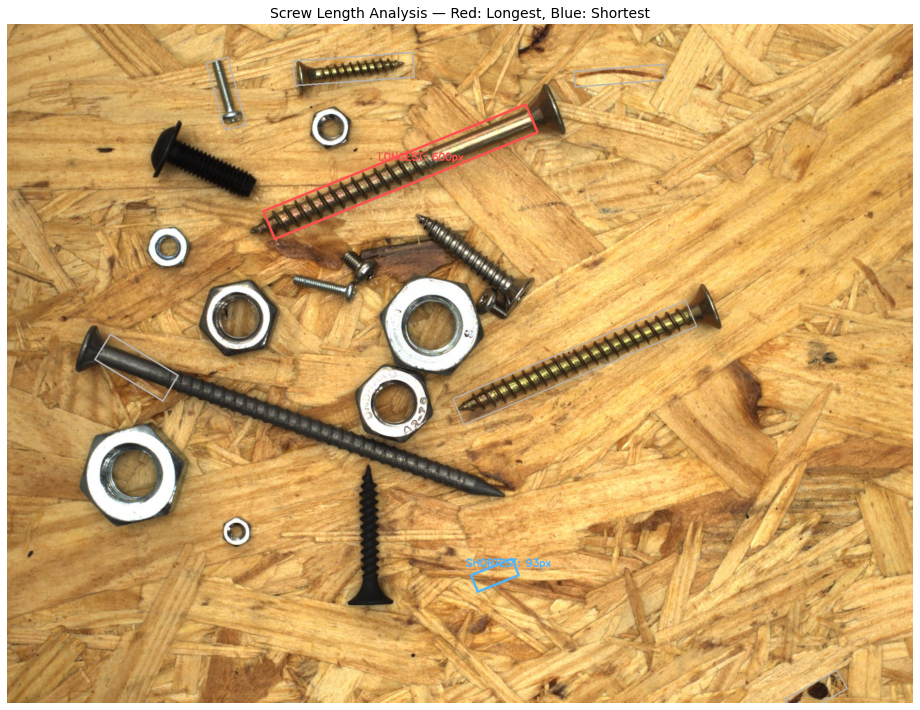

In [26]:
# Draw bounding boxes on shortest and longest screws
if shortest and longest:
    vis_screws = img_rgb.copy()
    
    # All screws in thin gray
    for s in screws:
        box = cv2.boxPoints(s['rect']).astype(np.int32)
        cv2.drawContours(vis_screws, [box], 0, (180, 180, 180), 2)
    
    # Shortest in blue (thick)
    box_short = cv2.boxPoints(shortest['rect']).astype(np.int32)
    cv2.drawContours(vis_screws, [box_short], 0, (80, 180, 255), 4)
    cx, cy = shortest['centroid']
    cv2.putText(vis_screws, f"SHORTEST: {shortest['width']:.0f}px",
                (cx - 60, cy - 20), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (80, 180, 255), 2)
    
    # Longest in red (thick)
    box_long = cv2.boxPoints(longest['rect']).astype(np.int32)
    cv2.drawContours(vis_screws, [box_long], 0, (255, 80, 80), 4)
    cx, cy = longest['centroid']
    cv2.putText(vis_screws, f"LONGEST: {longest['width']:.0f}px",
                (cx - 60, cy - 20), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 80, 80), 2)
    
    plt.figure(figsize=(14, 10))
    plt.imshow(vis_screws)
    plt.title('Screw Length Analysis — Red: Longest, Blue: Shortest', fontsize=14)
    plt.axis('off')
    plt.tight_layout()
    plt.show()


### 7.2 Measuring Nut Diameters

In [27]:
# Analyze nuts
if nuts:
    print("NUT MEASUREMENTS (pixels)")
    print("-" * 55)
    print(f"{'#':>3} {'Diameter (px)':>13} {'Circularity':>12} {'Solidity':>10}")
    print("-" * 55)
    
    for i, n in enumerate(sorted(nuts, key=lambda x: max(x['width'], x['height']), reverse=True)):
        # Approximate diameter as average of width and height
        diameter = (n['width'] + n['height']) / 2
        n['diameter'] = diameter
        print(f"{i:3d} {diameter:13.1f} {n['circularity']:12.3f} {n['solidity']:10.3f}")
    
    # Add diameter to all nut objects
    for n in nuts:
        n['diameter'] = (n['width'] + n['height']) / 2
    
    smallest_nut = min(nuts, key=lambda x: x['diameter'])
    largest_nut = max(nuts, key=lambda x: x['diameter'])
    
    print(f"\n  Largest nut:   {largest_nut['diameter']:.1f} px diameter")
    print(f"  Smallest nut:  {smallest_nut['diameter']:.1f} px diameter")
    print(f"  Ratio:         {largest_nut['diameter']/smallest_nut['diameter']:.1f}x")
else:
    print("No nuts detected")
    smallest_nut = largest_nut = None


NUT MEASUREMENTS (pixels)
-------------------------------------------------------
  # Diameter (px)  Circularity   Solidity
-------------------------------------------------------
  0         222.9        0.631      0.938
  1         169.3        0.588      0.920
  2          87.8        0.684      0.937
  3          87.9        0.652      0.930
  4          53.8        0.815      0.972

  Largest nut:   222.9 px diameter
  Smallest nut:  53.8 px diameter
  Ratio:         4.1x


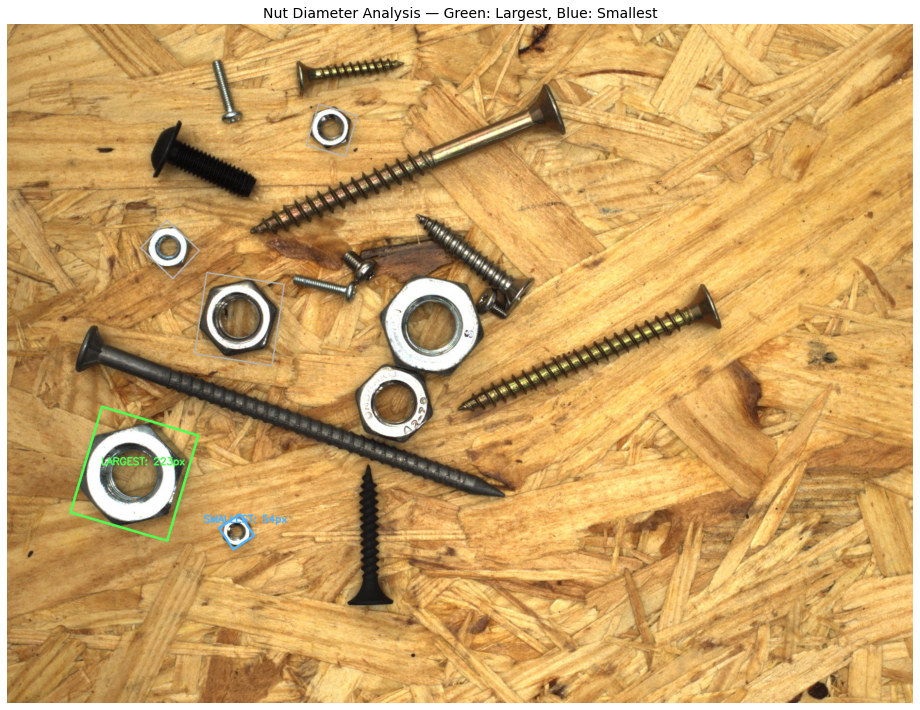

In [28]:
# Draw bounding boxes on smallest and largest nuts
if smallest_nut and largest_nut:
    vis_nuts = img_rgb.copy()
    
    # All nuts in thin gray
    for n in nuts:
        box = cv2.boxPoints(n['rect']).astype(np.int32)
        cv2.drawContours(vis_nuts, [box], 0, (180, 180, 180), 2)
    
    # Smallest in blue
    box_small = cv2.boxPoints(smallest_nut['rect']).astype(np.int32)
    cv2.drawContours(vis_nuts, [box_small], 0, (80, 180, 255), 4)
    cx, cy = smallest_nut['centroid']
    cv2.putText(vis_nuts, f"SMALLEST: {smallest_nut['diameter']:.0f}px",
                (cx - 70, cy - 20), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (80, 180, 255), 2)
    
    # Largest in green
    box_large = cv2.boxPoints(largest_nut['rect']).astype(np.int32)
    cv2.drawContours(vis_nuts, [box_large], 0, (80, 255, 80), 4)
    cx, cy = largest_nut['centroid']
    cv2.putText(vis_nuts, f"LARGEST: {largest_nut['diameter']:.0f}px",
                (cx - 70, cy - 20), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (80, 255, 80), 2)
    
    plt.figure(figsize=(14, 10))
    plt.imshow(vis_nuts)
    plt.title('Nut Diameter Analysis — Green: Largest, Blue: Smallest', fontsize=14)
    plt.axis('off')
    plt.tight_layout()
    plt.show()


---
## Part 8: Visualizing the Feature Space

Let's plot our objects in feature space to see how well our hand-crafted features separate the classes. This is exactly what a CNN does internally — but it learns the features automatically.


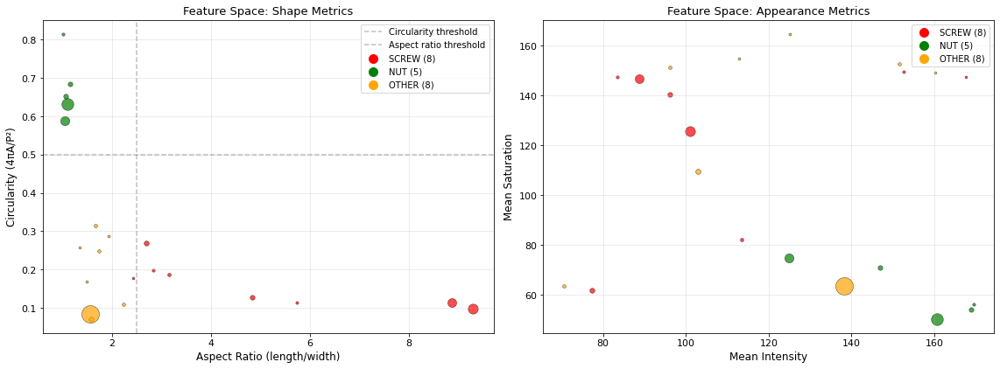

In [29]:
# Scatter plot: Aspect Ratio vs Circularity
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

color_map = {'SCREW': 'red', 'NUT': 'green', 'OTHER': 'orange'}

# Plot 1: Aspect Ratio vs Circularity
for obj in objects:
    axes[0].scatter(obj['aspect_ratio'], obj['circularity'],
                    c=color_map[obj['label']], s=obj['area']/200,
                    alpha=0.7, edgecolors='black', linewidth=0.5)
axes[0].set_xlabel('Aspect Ratio (length/width)', fontsize=12)
axes[0].set_ylabel('Circularity (4πA/P²)', fontsize=12)
axes[0].set_title('Feature Space: Shape Metrics', fontsize=13)
axes[0].axhline(y=0.5, color='gray', linestyle='--', alpha=0.5, label='Circularity threshold')
axes[0].axvline(x=2.5, color='gray', linestyle='--', alpha=0.5, label='Aspect ratio threshold')

# Plot 2: Mean Intensity vs Saturation 
for obj in objects:
    axes[1].scatter(obj['mean_intensity'], obj['mean_saturation'],
                    c=color_map[obj['label']], s=obj['area']/200,
                    alpha=0.7, edgecolors='black', linewidth=0.5)
axes[1].set_xlabel('Mean Intensity', fontsize=12)
axes[1].set_ylabel('Mean Saturation', fontsize=12)
axes[1].set_title('Feature Space: Appearance Metrics', fontsize=13)

# Add legends
for label, color in color_map.items():
    count = sum(1 for o in objects if o['label'] == label)
    for ax in axes:
        ax.scatter([], [], c=color, s=100, label=f'{label} ({count})')
for ax in axes:
    ax.legend(fontsize=10)
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


#### 📊 What the Feature Plots Tell Us

**Shape metrics (left):** Screws (red) cluster in the high-aspect-ratio, low-circularity region. Nuts (green) cluster in the low-aspect-ratio, high-circularity region. Clean separation → our rules work well for these two classes.

**Appearance metrics (right):** Chrome nuts are bright with low saturation. Dark screws are dim. But brass screws overlap with some background regions in appearance space — this is why color-only approaches fail.

**Key takeaway:** No single feature perfectly separates all classes. Real-world classification always requires *multiple* features working together. This is exactly why CNNs use thousands of learned features simultaneously.


---
## Part 9: Complete Pipeline Summary

Here's our full image processing pipeline, end to end:

```
INPUT IMAGE
    │
    ├── 1. Color Space Conversion (BGR → Gray, HSV)
    │
    ├── 2. Bilateral Filtering (smooth texture, preserve edges)
    │
    ├── 3. Background Estimation (large median filter)
    │
    ├── 4. Multi-Threshold Segmentation
    │      ├── Background subtraction (|pixel - local_bg| > threshold)
    │      └── Bright metal detection (high V + low S in HSV)
    │
    ├── 5. Morphological Cleanup (Open → Close → Open)
    │
    ├── 6. Watershed Separation (distance transform → markers → watershed)
    │
    ├── 7. Contour Extraction & Area Filtering
    │
    ├── 8. Feature Extraction (aspect ratio, circularity, solidity, intensity)
    │
    ├── 9. Rule-Based Classification (screw / nut / washer)
    │
    └── 10. Measurement & Visualization
            ├── Screw lengths via oriented bounding box
            └── Nut diameters via average bbox dimensions
```


### 🔗 Direct Connection to Your Defect Detection Project

Every technique in this tutorial maps to your steel surface defect detection pipeline:

| This Tutorial | Steel Defect Detection |
|---|---|
| Bilateral filtering | Preprocessing: reduce sensor noise while preserving defect edges |
| Background subtraction | Detecting anomalies: defects deviate from "normal" surface |
| Thresholding + morphology | Segmenting defect regions from clean steel |
| Contour analysis | Measuring defect size, shape, and position |
| Feature extraction | Characterizing defect types (crack vs pit vs inclusion) |
| Rule-based classification | What models like CNNs learn to replace with learned features |

**The deep learning advantage:** Instead of manually designing these features and thresholds (which break when conditions change), a CNN *learns* optimal features from data. But it's learning the same kinds of patterns — edges, textures, shapes, spatial relationships — that you just coded by hand.


---
## Bonus: Edge Detection Techniques

Edge detection is fundamental to many vision pipelines. Let's explore the main approaches.


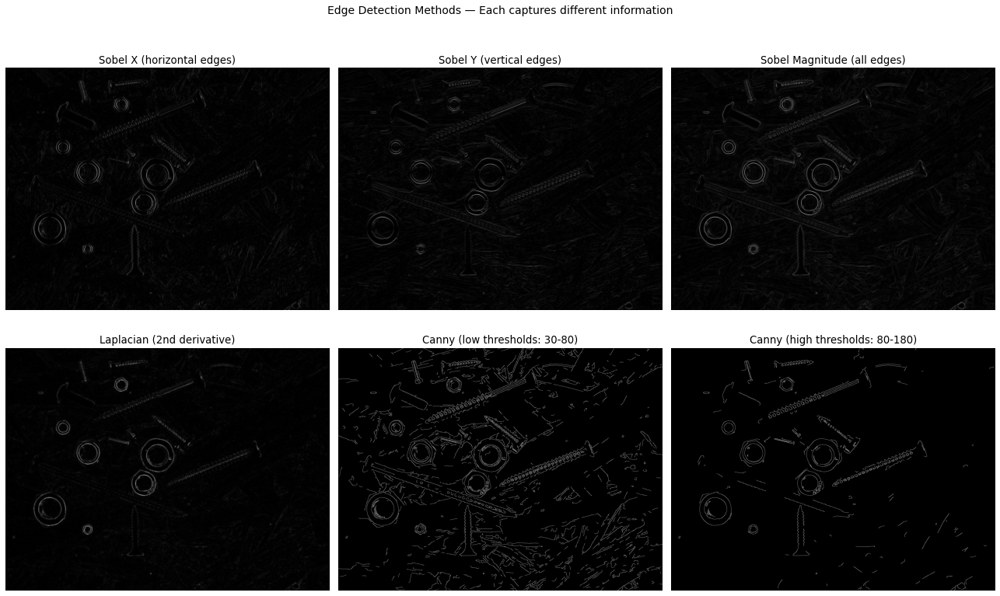

In [30]:
# Edge detection comparison
fig, axes = plt.subplots(2, 3, figsize=(18, 11))

# Sobel edges (gradient-based)
sobel_x = cv2.Sobel(filtered, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(filtered, cv2.CV_64F, 0, 1, ksize=3)
sobel_mag = np.sqrt(sobel_x**2 + sobel_y**2)
sobel_mag = cv2.normalize(sobel_mag, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

axes[0,0].imshow(np.abs(sobel_x), cmap='gray')
axes[0,0].set_title('Sobel X (horizontal edges)')
axes[0,1].imshow(np.abs(sobel_y), cmap='gray')
axes[0,1].set_title('Sobel Y (vertical edges)')
axes[0,2].imshow(sobel_mag, cmap='gray')
axes[0,2].set_title('Sobel Magnitude (all edges)')

# Laplacian (second derivative)
laplacian = cv2.Laplacian(filtered, cv2.CV_64F, ksize=5)
laplacian_abs = cv2.normalize(np.abs(laplacian), None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
axes[1,0].imshow(laplacian_abs, cmap='gray')
axes[1,0].set_title('Laplacian (2nd derivative)')

# Canny (the gold standard)
canny_low = cv2.Canny(filtered, 30, 80)
canny_high = cv2.Canny(filtered, 80, 180)

axes[1,1].imshow(canny_low, cmap='gray')
axes[1,1].set_title('Canny (low thresholds: 30-80)')
axes[1,2].imshow(canny_high, cmap='gray')
axes[1,2].set_title('Canny (high thresholds: 80-180)')

for ax in axes.flat: ax.axis('off')
plt.suptitle('Edge Detection Methods — Each captures different information', fontsize=14, y=1.01)
plt.tight_layout()
plt.show()


#### When to Use Each Edge Detector

- **Sobel**: When you need directional edge information (e.g., scratches tend to be horizontal on a steel coil)
- **Laplacian**: Sensitive to all edges, good for blob detection (but noisy)
- **Canny**: Best general-purpose edge detector — uses non-maximum suppression and hysteresis thresholding for clean, thin edges

For defect detection, Canny + morphological closing is often a good starting point for initial segmentation.


---
## Bonus: Histogram Analysis

Histograms tell you the distribution of pixel intensities — essential for understanding your data and choosing appropriate thresholds.


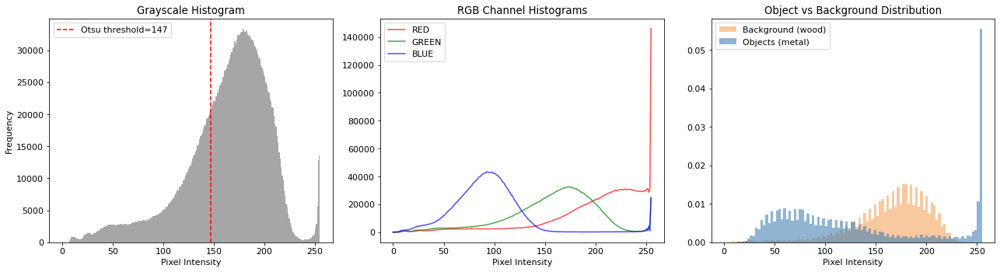


📊 The bimodal distribution of object pixels (dark screws + bright nuts)
   explains why no single threshold works — objects span the entire intensity range!


In [31]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Grayscale histogram
axes[0].hist(gray.ravel(), bins=256, range=(0, 255), color='gray', alpha=0.7)
axes[0].set_title('Grayscale Histogram')
axes[0].set_xlabel('Pixel Intensity')
axes[0].set_ylabel('Frequency')
axes[0].axvline(x=otsu_val, color='red', linestyle='--', label=f'Otsu threshold={otsu_val:.0f}')
axes[0].legend()

# Per-channel histogram (RGB)
colors = ('red', 'green', 'blue')
for i, color in enumerate(colors):
    hist = cv2.calcHist([img_rgb], [i], None, [256], [0, 256])
    axes[1].plot(hist, color=color, alpha=0.7, label=color.upper())
axes[1].set_title('RGB Channel Histograms')
axes[1].set_xlabel('Pixel Intensity')
axes[1].legend()

# Compare object vs background intensity distributions
bg_mask_inv = cv2.bitwise_not(clean_mask)
obj_pixels = gray[clean_mask > 0]
bg_pixels = gray[bg_mask_inv > 0]

axes[2].hist(bg_pixels, bins=100, range=(0, 255), alpha=0.6, color='sandybrown', label='Background (wood)', density=True)
axes[2].hist(obj_pixels, bins=100, range=(0, 255), alpha=0.6, color='steelblue', label='Objects (metal)', density=True)
axes[2].set_title('Object vs Background Distribution')
axes[2].set_xlabel('Pixel Intensity')
axes[2].legend()

plt.tight_layout()
plt.show()

print("\n📊 The bimodal distribution of object pixels (dark screws + bright nuts)")
print("   explains why no single threshold works — objects span the entire intensity range!")


---
*End of Tutorial — Happy coding! 🔧*
